In [8]:
import os
import glob
import zipfile
import numpy as np
import pandas as pd
from tqdm import tqdm
from sentence_transformers import util
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.cluster import BaseCluster

# Flickr 8k images
img_folder = 'photos/'
caps_folder = 'captions/'
if not os.path.exists(img_folder) or len(os.listdir(img_folder)) == 0:
    os.makedirs(img_folder, exist_ok=True)

    if not os.path.exists('Flickr8k_Dataset.zip'):   #Download dataset if does not exist
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip', 'Flickr8k_Dataset.zip')
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip', 'Flickr8k_text.zip')

    for folder, file in [(img_folder, 'Flickr8k_Dataset.zip'), (caps_folder, 'Flickr8k_text.zip')]:
        with zipfile.ZipFile(file, 'r') as zf:
            for member in tqdm(zf.infolist(), desc='Extracting'):
                zf.extract(member, folder)
images = list(glob.glob('photos/Flicker8k_Dataset/*.jpg'))

In [9]:
load = True
embedding_model = MultiModalBackend('clip-ViT-B-32', batch_size=32)
min_topic_size = max(1,int(0.1*len(images)))
if(not load):
    min_topic_size = max(1,int(0.1*len(images)))
    embeddings = embedding_model.embed_images(images = images, verbose = True)
    umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
    hdbscan_model = HDBSCAN(min_cluster_size=min_topic_size, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
    reduced_embeddings = umap_model.fit_transform(embeddings)
    umap_model_2d = UMAP(n_components=2, n_neighbors=15, random_state=42, metric="cosine", verbose=False)
    reduced_embeddings_2d = umap_model_2d.fit_transform(embeddings)
    clusters = hdbscan_model.fit(reduced_embeddings).labels_
    with open(f'saved_embeddings/5d_embeddings.npy', 'wb') as f:
            np.save(f, reduced_embeddings)
    with open(f'saved_embeddings/2d_embeddings.npy', 'wb') as f:
            np.save(f, reduced_embeddings_2d)
    with open(f'saved_embeddings/clusters.npy', 'wb') as f:
            np.save(f, clusters)
    with open(f'saved_embeddings/embeddings.npy', 'wb') as f:
        np.save(f, embeddings)
else:
    with open(f'saved_embeddings/5d_embeddings.npy', 'rb') as f:
            reduced_embeddings = np.load(f)
    with open(f'saved_embeddings/2d_embeddings.npy', 'rb') as f:
            reduced_embeddings_2d = np.load(f)
    with open(f'saved_embeddings/clusters.npy', 'rb') as f:
            clusters = np.load(f)
    with open(f'saved_embeddings/embeddings.npy', 'rb') as f:
        embeddings = np.load(f)

In [2]:
from bertopic.representation import KeyBERTInspired, VisualRepresentation
from bertopic.backend import MultiModalBackend

# Image embedding model
embedding_model = MultiModalBackend('clip-ViT-B-32', batch_size=32)

# Image to text representation model
representation_model = {
    "Visual_Aspect": VisualRepresentation(image_to_text_model="nlpconnect/vit-gpt2-image-captioning")
}

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


In [11]:


class Dimensionality:
  """ Use this for pre-calculated reduced embeddings """
  def __init__(self, reduced_embeddings):
    self.reduced_embeddings = reduced_embeddings

  def fit(self, X):
    return self

  def transform(self, X):
    return self.reduced_embeddings


# Prepare sub-models
umap_model = Dimensionality(reduced_embeddings)
hdbscan_model = BaseCluster()

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,

  verbose=True
)



# Train model
topic_model.fit(documents = None, images = images, embeddings=embeddings, y=clusters)

# Show topics
topic_model.get_topic_info()

2024-04-26 11:31:28,471 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-26 11:31:28,472 - BERTopic - Dimensionality - Completed ✓
2024-04-26 11:31:28,474 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-04-26 11:31:28,574 - BERTopic - Cluster - Completed ✓
2024-04-26 11:31:28,816 - BERTopic - Images - Converting images to text. This might take a while.
  0%|          | 0/3 [00:00<?, ?it/s]We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.
100%|██████████| 3/3 [00:19<00:00,  6.34s/it]
2024-04-26 11:31:49,225 - BERTopic - Images - Completed ✓
100%|██████████| 3/3 [00:00<00:00, 20.74it/s]


,Topic,Count,Name,Representation,Visual_Aspect,Representative_Docs
0,-1,80,-1_game_being_football_played,"[game, being, football, played, soccer, profes...",<PIL.Image.Image image mode=RGB size=900x600 a...,"[a professional soccer game being played , a p..."
1,0,5944,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p..."
2,1,2067,1_dog_running_in_field,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...


,Topic,Count,Representation,Visual_Aspect
0,-1,80,"[game, being, football, played, soccer, professional, of, baseball, field, on]",
1,0,5944,"[is, the, in, air, skateboard, jumping, with, on, man, person]",
2,1,2067,"[dog, running, in, field, grass, with, frisbee, the, its, mouth]",

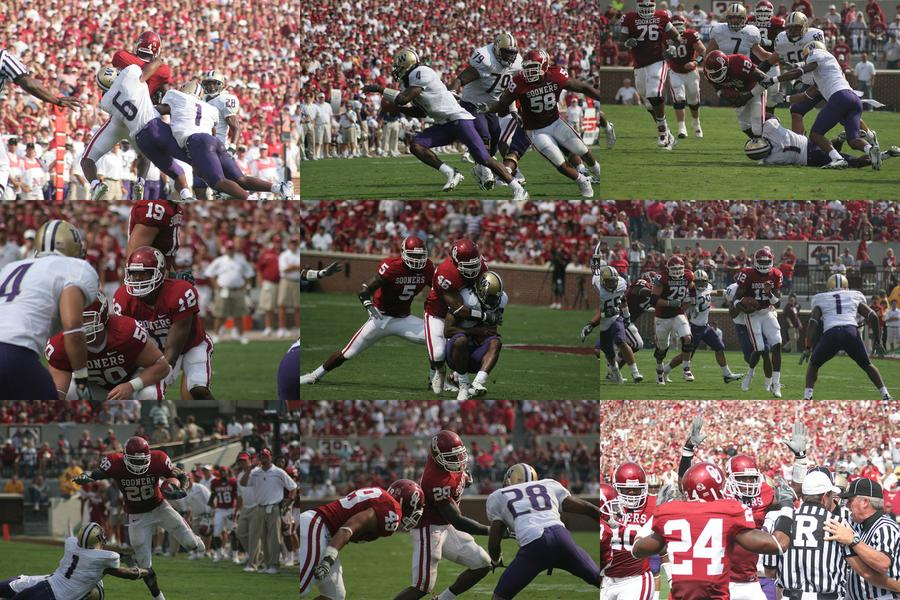
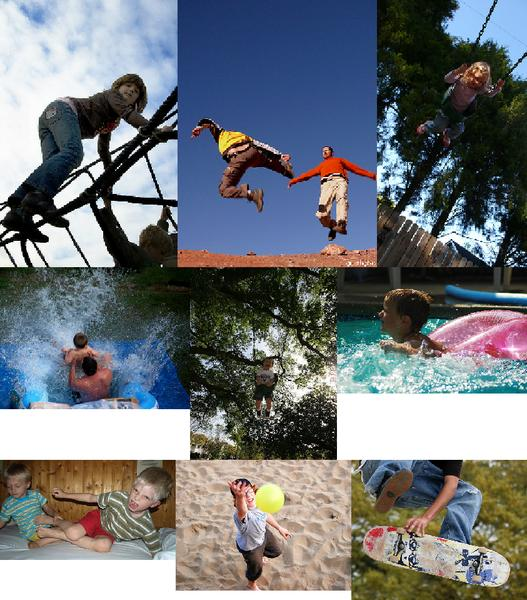
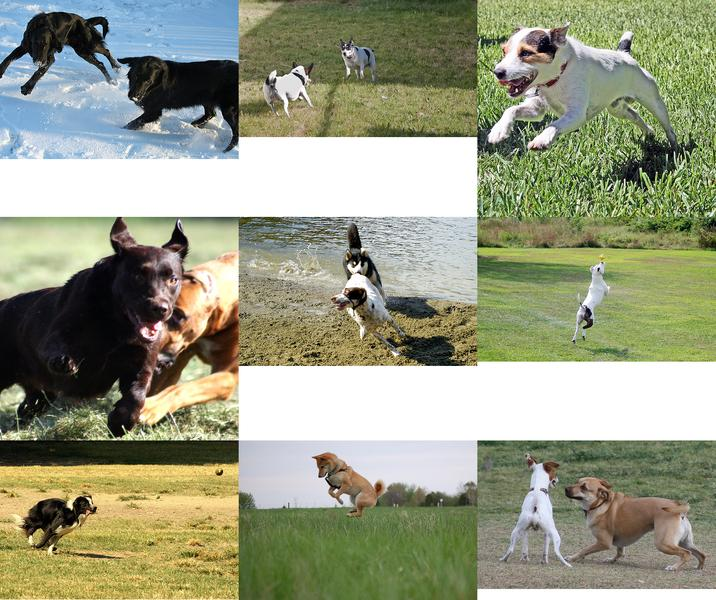

In [12]:
import base64
from io import BytesIO
from IPython.display import HTML

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()


def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

# Extract dataframe
df = topic_model.get_topic_info().drop(["Representative_Docs", "Name"],axis=1)

# df.head()
# Visualize the images
HTML(df.to_html(formatters={'Visual_Aspect': image_formatter}, escape=False))

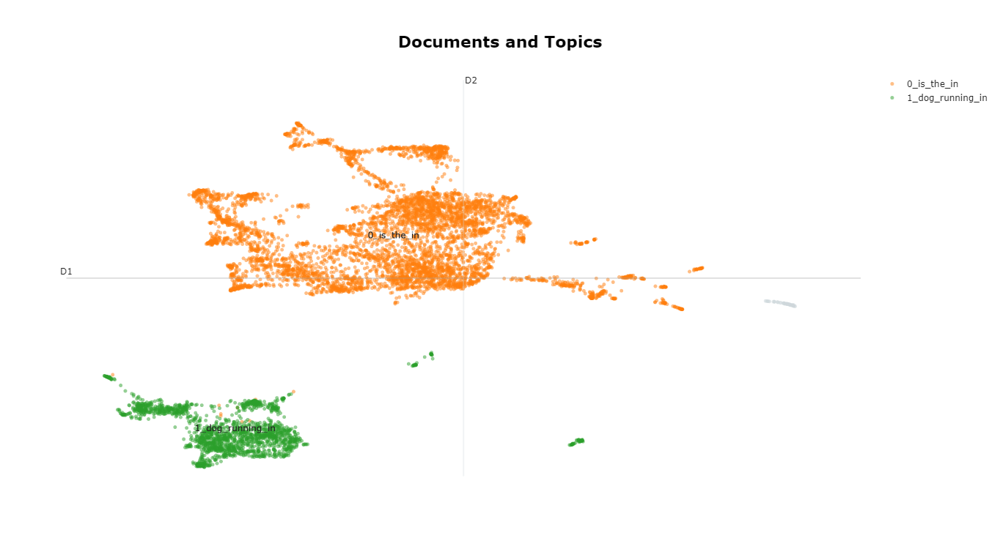

In [13]:
topic_model.visualize_documents(images, reduced_embeddings=reduced_embeddings_2d, hide_document_hover=True)


In [16]:
hdbscan_model = HDBSCAN(min_cluster_size=30, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
clusters = hdbscan_model.fit(reduced_embeddings).labels_

In [ ]:

class Dimensionality:
  """ Use this for pre-calculated reduced embeddings """
  def __init__(self, reduced_embeddings):
    self.reduced_embeddings = reduced_embeddings

  def fit(self, X):
    return self

  def transform(self, X):
    return self.reduced_embeddings


# Prepare sub-models
umap_model = Dimensionality(reduced_embeddings)
hdbscan_model = BaseCluster()

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,

  verbose=True
)



# Train model
topic_model.fit(documents = None, images = images, embeddings=embeddings, y=clusters)

# Show topics
topic_model.get_topic_info()

,Topic,Count,Representation,Visual_Aspect
0,-1,1452,"[while, climbing, the, frisbee, air, in, rock, jumping, boy, boys]",
1,0,1575,"[bench, people, sitting, woman, walking, street, phone, cell, next, outside]",
2,1,1168,"[girl, little, boy, holding, young, park, wooden, metal, umbrella, bed]",
3,2,1058,"[grass, running, grassy, field, dog, across, through, cat, other, each]",
4,3,413,"[frisbee, running, dog, water, mouth, with, its, the, in, beach]",
5,4,207,"[skateboard, ramp, doing, trick, skateboarding, skateboarder, cement, man, down, riding]",
6,5,204,"[snow, covered, dog, running, its, across, through, out, tongue, surface]",
7,6,186,"[pool, blue, boy, toy, board, with, water, in, little, baby]",
8,7,182,"[mountain, range, standing, slope, backpack, top, snowboard, covered, person, skis]",
9,8,132,"[beach, surfboard, standing, with, ocean, child, group, walking, woman, running]",

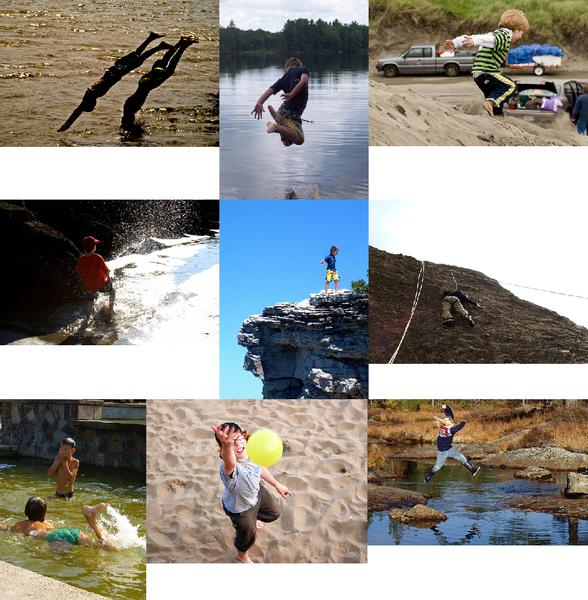
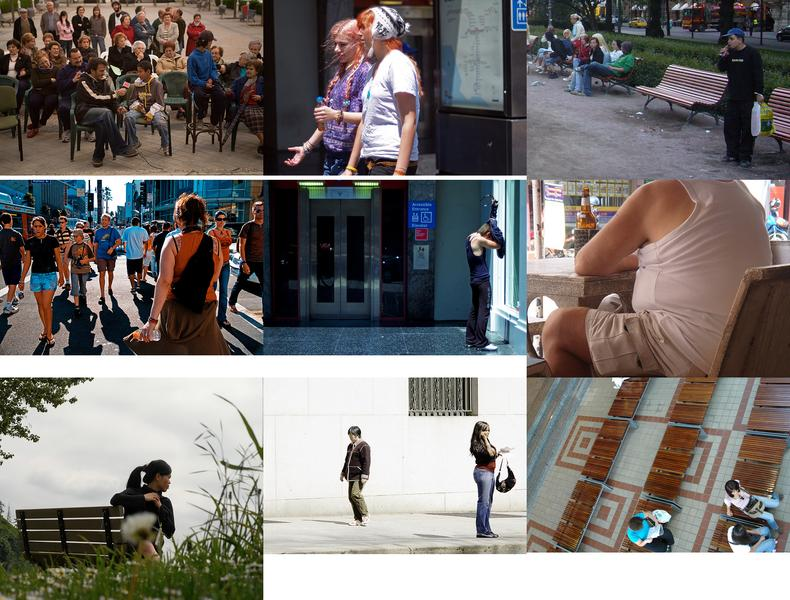
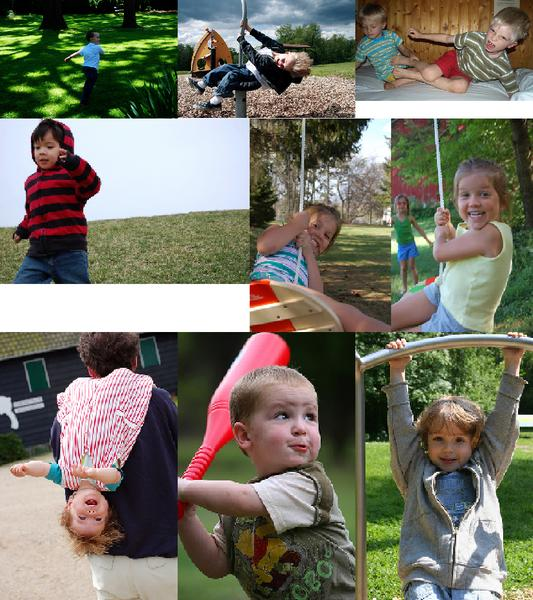
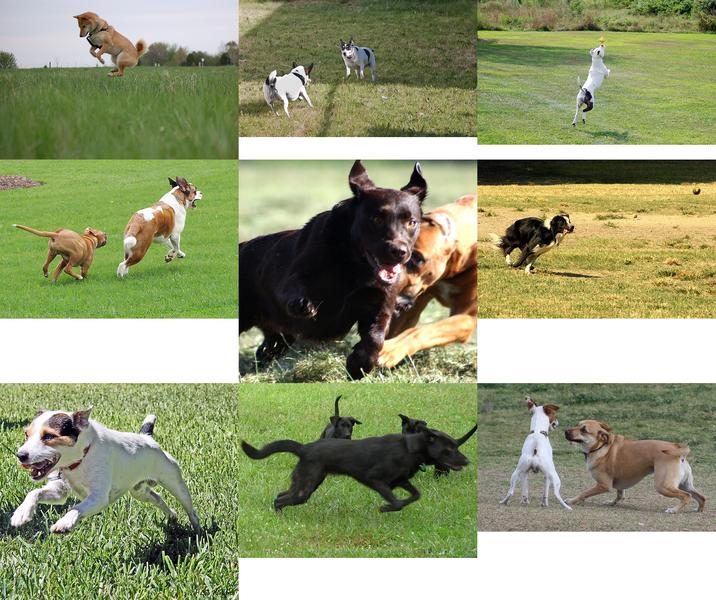
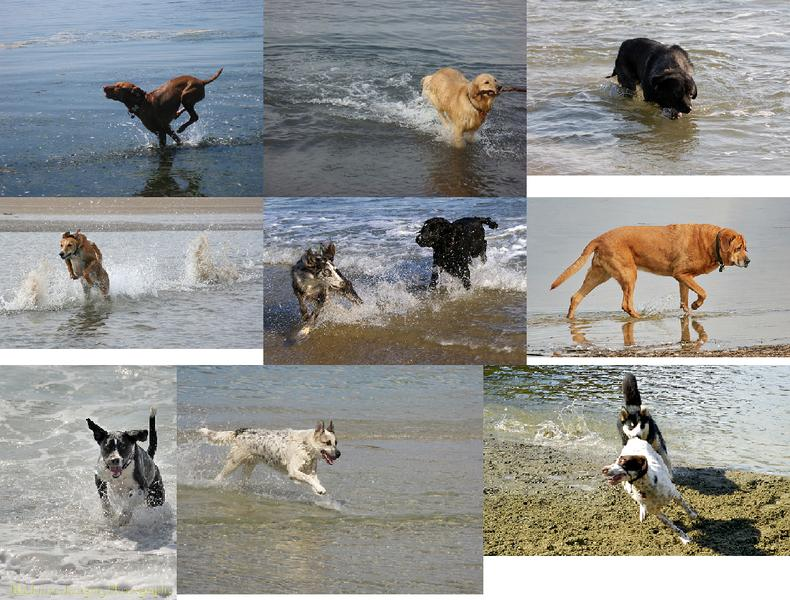
...
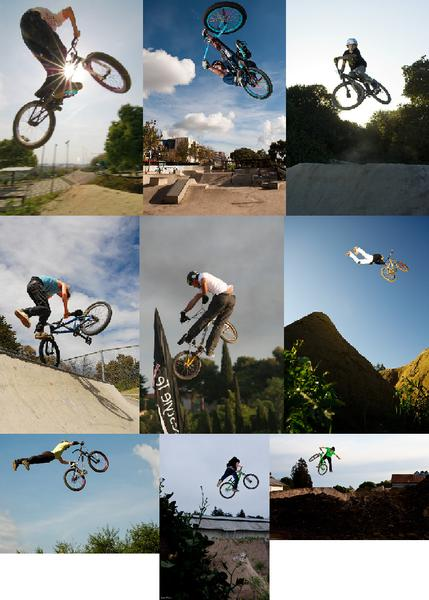
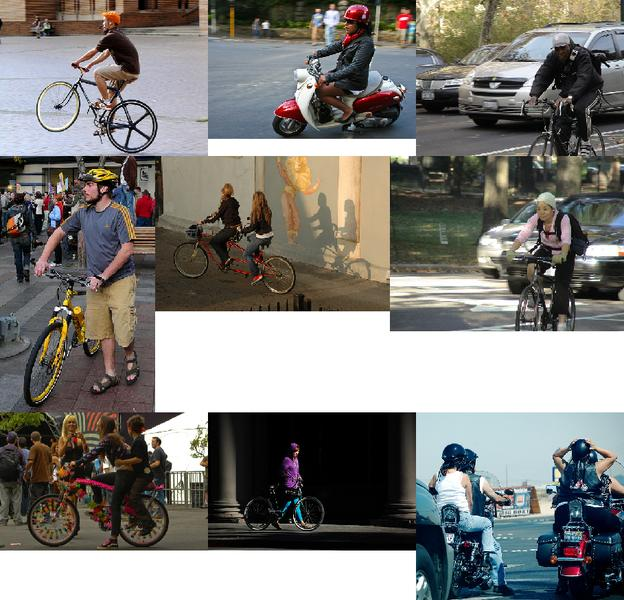
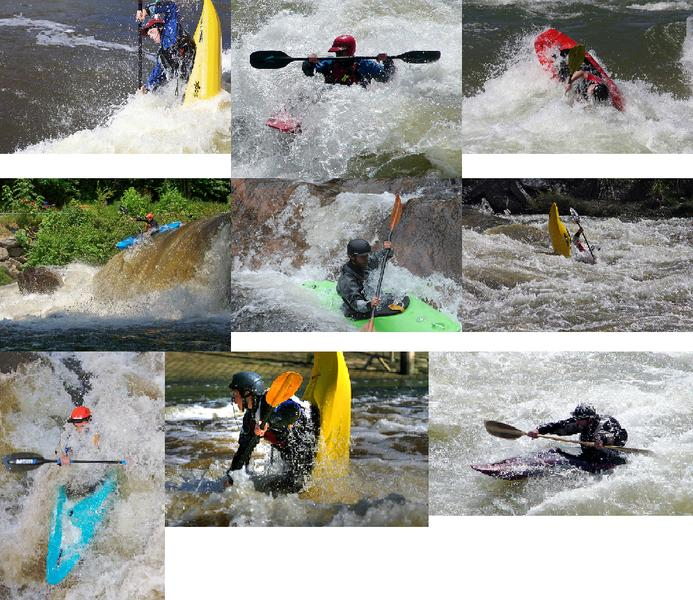
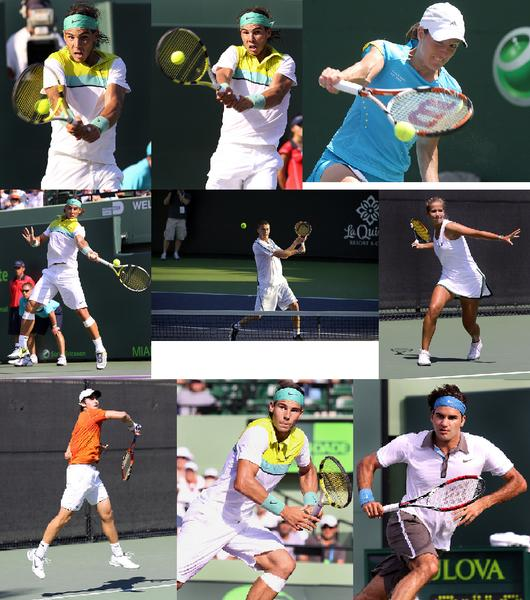
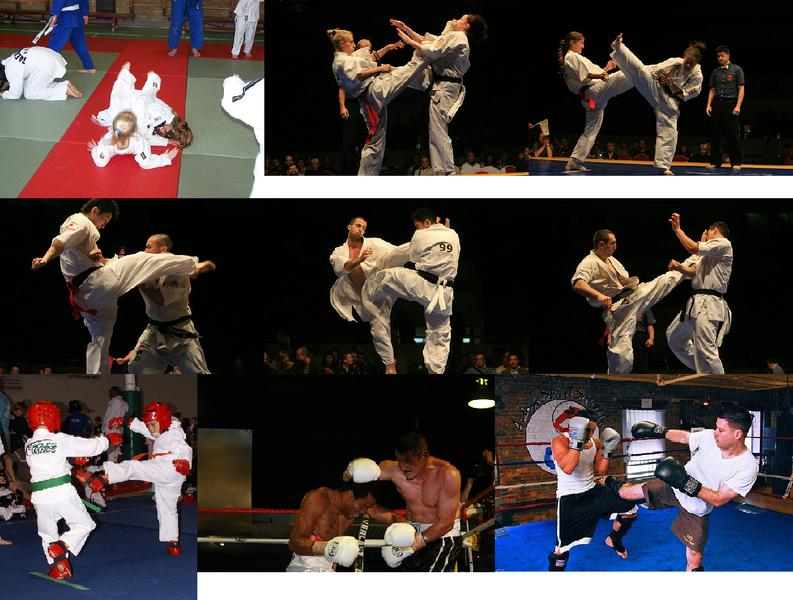

In [18]:
import base64
from io import BytesIO
from IPython.display import HTML

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()


def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

# Extract dataframe
df = topic_model.get_topic_info().drop(["Representative_Docs", "Name"],axis=1)

# df.head()
# Visualize the images
HTML(df.to_html(formatters={'Visual_Aspect': image_formatter}, escape=False))

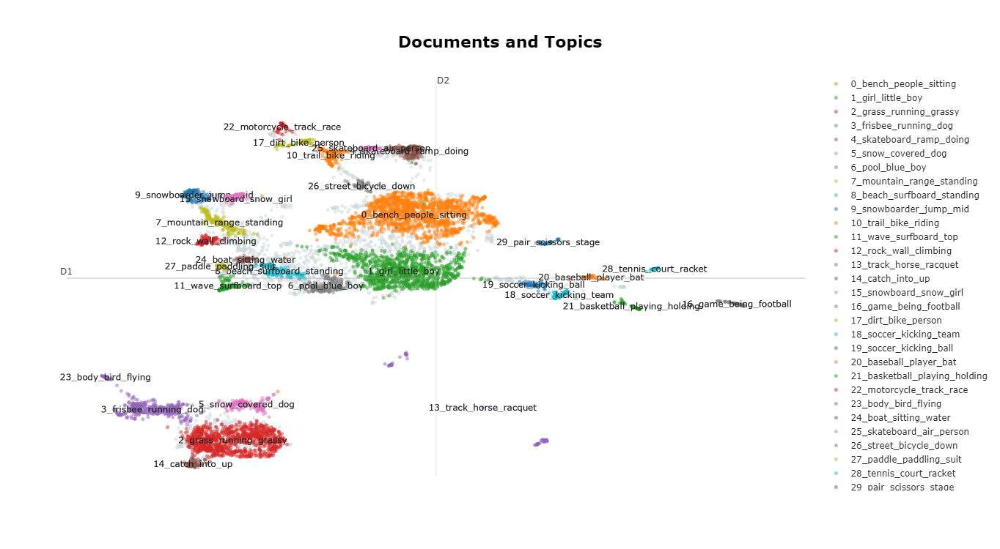

In [19]:
topic_model.visualize_documents(images, reduced_embeddings=reduced_embeddings_2d, hide_document_hover=True)
